In [113]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle
import fft_analysis as ffta

In [2]:
def getPathfiles(string_path):
    list_files = os.listdir(string_path)
    
    # Agrego este artilugio para que ordene los archivos según el largo de su nombre
    list_files.sort(key=str.__len__)
    
    list_pathfiles = []
    for i in list_files:
        filepath = string_path+'/'+i
        list_pathfiles.append(filepath)
    
    dictionary = dict()
    
    for i in range(len(list_files)):
        dictionary[list_files[i]] = list_pathfiles[i]
    
    return dictionary

def getImagesFromPathfile(list_pathfile,mode=cv2.COLOR_BGR2GRAY):
    list_imgs = []
    for i in range(len(list_pathfile)):
        img = cv2.imread(list_pathfile[i])
        img = cv2.cvtColor(img, mode)
        list_imgs.append(img)
        
    return list_imgs

In [3]:
dict_folder_paibyb5 = getPathfiles('PAIByB-5')
dict_folder_paibyb6 = getPathfiles('PAIByB-6')

print(dict_folder_paibyb5)
print(dict_folder_paibyb6)

dict_folder_paibyb5_values = [*dict_folder_paibyb5.values()]
dict_folder_paibyb6_values = [*dict_folder_paibyb6.values()]

imgs_folder_paibyb5 = getImagesFromPathfile(dict_folder_paibyb5_values)
imgs_folder_paibyb6 = getImagesFromPathfile(dict_folder_paibyb6_values)


{'img-1.tif': 'PAIByB-5/img-1.tif', 'img-2.tif': 'PAIByB-5/img-2.tif', 'img-3.tif': 'PAIByB-5/img-3.tif', 'img-4.tif': 'PAIByB-5/img-4.tif', 'img-11.tif': 'PAIByB-5/img-11.tif', 'img-12.tif': 'PAIByB-5/img-12.tif'}
{'img-1.tif': 'PAIByB-6/img-1.tif', 'img-2.tif': 'PAIByB-6/img-2.tif', 'img-3.tif': 'PAIByB-6/img-3.tif', 'img-11.tif': 'PAIByB-6/img-11.tif', 'img-12.tif': 'PAIByB-6/img-12.tif'}


In [4]:
values_paibyb5_group1   = dict_folder_paibyb5_values[:-2]
imgs_paibyb5_group1     = imgs_folder_paibyb5[:-2]

print(values_paibyb5_group1)

values_paibyb5_group2   = dict_folder_paibyb5_values[-2:]
imgs_paibyb5_group2     = imgs_folder_paibyb5[-2:]

print(values_paibyb5_group2)

['PAIByB-5/img-1.tif', 'PAIByB-5/img-2.tif', 'PAIByB-5/img-3.tif', 'PAIByB-5/img-4.tif']
['PAIByB-5/img-11.tif', 'PAIByB-5/img-12.tif']


In [5]:
values_paibyb6_group1   = dict_folder_paibyb6_values[:-2]
imgs_paibyb6_group1     = imgs_folder_paibyb6[:-2]

print(values_paibyb6_group1)

values_paibyb6_group2   = dict_folder_paibyb6_values[-2:]
imgs_paibyb6_group2     = imgs_folder_paibyb6[-2:]

print(values_paibyb6_group2)

['PAIByB-6/img-1.tif', 'PAIByB-6/img-2.tif', 'PAIByB-6/img-3.tif']
['PAIByB-6/img-11.tif', 'PAIByB-6/img-12.tif']


In [6]:
def plotImgs(list_names,list_imgs):

    fig = plt.figure(figsize=(20,10))

    for i in range(len(list_names)):
        ax = fig.add_subplot(1,len(list_names),i+1)
        ax.imshow(list_imgs[i],cmap='gray')
        ax.set_title(list_names[i])

    plt.show()

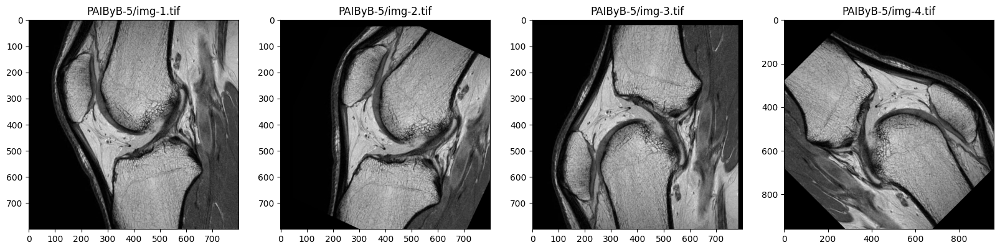

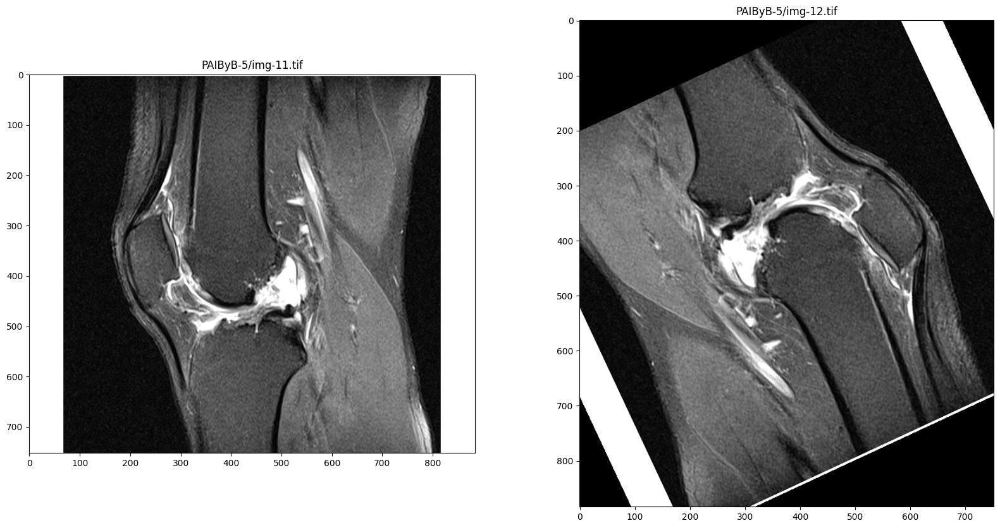

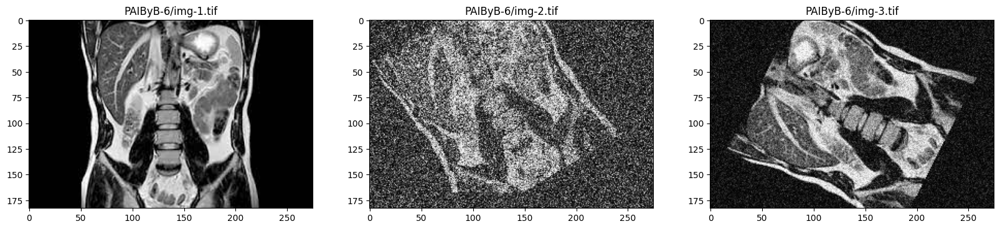

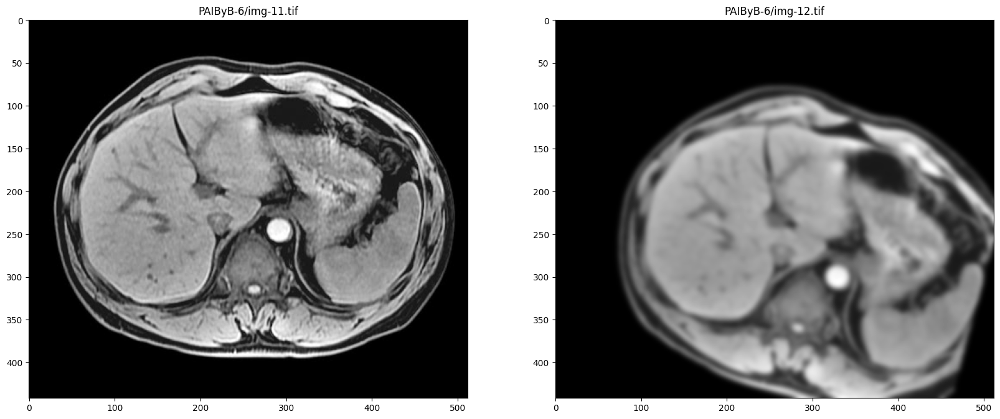

In [7]:
plotImgs(values_paibyb5_group1,imgs_paibyb5_group1)
plotImgs(values_paibyb5_group2,imgs_paibyb5_group2)
plotImgs(values_paibyb6_group1,imgs_paibyb6_group1)
plotImgs(values_paibyb6_group2,imgs_paibyb6_group2)

In [249]:
def matchImg(fixed_img,template,a=0.1,mode=0,flip_template=False,resize_template=False,cut_template=False,counterclockwise=True,b=0.4):
    
    """
    1) mode = 0: shifting
    2) mode = 1: rotation + shifting
    3) mode = 2: trim + rotation + shifting
    
    """
    
    if flip_template:
        template = cv2.flip(template,0)
    
    if resize_template:
        template = cv2.resize(template, np.shape(fixed_img))
        
    if cut_template:
        template = template[:fixed_img.shape[0],:fixed_img.shape[1]]
    
    # img.shape = (alto,ancho) = (h,w)
    
    h0, w0 = template.shape
    
    template_cut = template[int(a*h0):int((1-a)*h0),int(a*w0):int((1-a)*w0)]
    
    h1, w1 = template_cut.shape
    
    if mode == 0:
        
        # Se averigua la coordenada de máxima correlación
        res = cv2.matchTemplate(fixed_img,template_cut,cv2.TM_CCORR_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        
        # Se traslada el template según la coordenada de máxima correlación
        M_tras_template = np.float32([[1, 0, int(max_loc[0]-a*w0)], [0, 1, int(max_loc[1]-a*h0)]])
        
        template_shifted = cv2.warpAffine(template, M_tras_template,fixed_img.shape[::-1])
        
        data = [max_val]
        
        return template_shifted, data
        
    elif mode == 1:
        
        if counterclockwise:
            angles = np.arange(360)
        else:
            angles = (-1)*np.arange(360)
            
        xcorr_list = []
        coordinates_list = []

        for angle in angles:
            
            if angle == 0:
                res = cv2.matchTemplate(fixed_img,template,cv2.TM_CCORR_NORMED)
                
                min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
                
            else:
                M_rot = cv2.getRotationMatrix2D((h1//2, w1//2), angle, 1)  # Centro, ángulo, escala=1
            
                # Rotar la imagen a registrar
                img_rot = cv2.warpAffine(template_cut, M_rot, template_cut.shape[::-1], flags=cv2.INTER_LINEAR)
                
                res = cv2.matchTemplate(fixed_img,img_rot,cv2.TM_CCORR_NORMED)
            
                min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
                
            xcorr_list.append(max_val)
            coordinates_list.append(max_loc)

        # Se averigua el ángulo y coordenada de máxima correlación
        
        indexes = np.arange(len(angles))

        max_xcorr = np.max(xcorr_list)

        max_xcorr_index = indexes[xcorr_list == max_xcorr][0]

        angulo_max_xcorr = angles[max_xcorr_index]

        coor_max_xcorr = coordinates_list[max_xcorr_index]
        
        data = [angulo_max_xcorr,max_xcorr]
        
        # Se rota el template al ángulo máximo de correlación
        M_rot_template = cv2.getRotationMatrix2D((h1//2+int(a*h0), w1//2+int(a*w0)), angulo_max_xcorr, 1)  # Centro, ángulo, escala=1
        template_rot = cv2.warpAffine(template, M_rot_template, template.shape[::-1], flags=cv2.INTER_LINEAR)

        # Se traslada el template rotado según la coordenada de máxima correlación
        M_tras_template = np.float32([[1, 0, int(coor_max_xcorr[0]-a*w0)], [0, 1, int(coor_max_xcorr[1]-a*h0)]])
        
        template_rot_n_shifted = cv2.warpAffine(template_rot, M_tras_template, fixed_img.shape[::-1])
        
        return template_rot_n_shifted, data
    
    if mode == 2:
        
        dims = template.shape
        
        # 1- Se toma una porción pequeña de la imagen original y se la registra en modo 1 para calcular el ángulo de rotación
        img_piece = template[ int(dims[0]//2-0.2*dims[0]):int(dims[0]//2+0.2*dims[0]) , int(dims[1]//2-0.2*dims[1]):int(dims[1]//2+0.2*dims[1]) ]
        
        reg_piece, data_piece = matchImg(fixed_img,img_piece,mode=1,a=0)
        angle_to_rotate = data_piece[0]

        # 2- Una vez calculado el ángulo, se toma ese ángulo y se rota la imagen original
        matriz = cv2.getRotationMatrix2D((template.shape[0]//2, template.shape[1]//2), angle_to_rotate, 1)  # Centro, ángulo, escala=1
        tmpt = cv2.warpAffine(template, matriz, template.shape[::-1], flags=cv2.INTER_LINEAR)

        # 3- Se supone que la imagen no necesita rotar mas, entonces se debe trasladar al lugar que coincida con la imagen fija
        reg, data = matchImg(fixed_img,tmpt,mode=0,a=b)
        
        return reg, data

In [54]:
def plotMatchComparison(fixed_img,template,registration,diff_coeff=0.8,fixed_img_name='name',template_name='name'):
    
    fig = plt.figure(figsize=(20,5))
    ax = fig.add_subplot(1,4,1)
    ax.imshow(fixed_img,cmap = 'gray')
    ax.set_title(f'fixed_img - {fixed_img_name}')

    ax = fig.add_subplot(1,4,2)
    ax.imshow(template,cmap = 'gray')
    ax.set_title(f'template - {template_name}')

    ax = fig.add_subplot(1,4,3)
    ax.imshow(registration,cmap = 'gray')
    ax.set_title(f'registration - {template_name}')

    ax = fig.add_subplot(1,4,4)
    ax.imshow(cv2.absdiff(fixed_img, np.uint8(diff_coeff*registration)),cmap = 'gray')
    ax.set_title('Diferencia')

    plt.show()

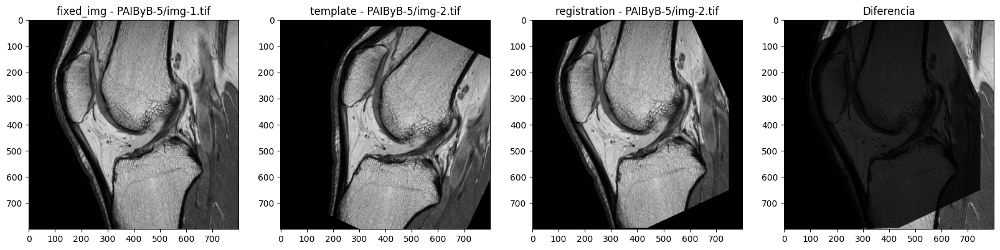

[np.int64(25), np.float64(0.9524941444396973)]


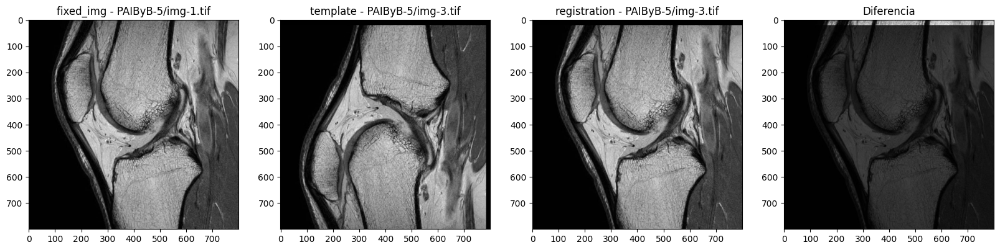

[0.9999999403953552]


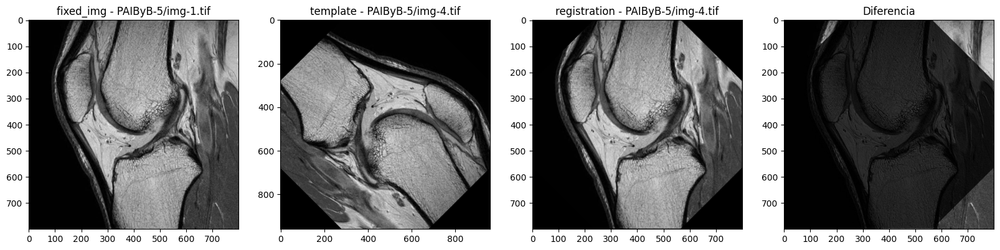

[np.int64(135), np.float64(0.9564709663391113)]


In [109]:
fixed_img_5g1 = imgs_paibyb5_group1[0]
reg_5g1_1, data_reg_5g1_1 = matchImg(fixed_img_5g1,imgs_paibyb5_group1[1],mode=1)
reg_5g1_2, data_reg_5g1_2 = matchImg(fixed_img_5g1,imgs_paibyb5_group1[2],mode=0,flip_template=True)
reg_5g1_3, data_reg_5g1_3 = matchImg(fixed_img_5g1,imgs_paibyb5_group1[3],mode=1,resize_template=True)

plotMatchComparison(fixed_img_5g1,imgs_paibyb5_group1[1],reg_5g1_1,fixed_img_name=values_paibyb5_group1[0],template_name=values_paibyb5_group1[1])
print(data_reg_5g1_1)
plotMatchComparison(fixed_img_5g1,imgs_paibyb5_group1[2],reg_5g1_2,fixed_img_name=values_paibyb5_group1[0],template_name=values_paibyb5_group1[2])
print(data_reg_5g1_2)
plotMatchComparison(fixed_img_5g1,imgs_paibyb5_group1[3],reg_5g1_3,fixed_img_name=values_paibyb5_group1[0],template_name=values_paibyb5_group1[3])
print(data_reg_5g1_3)

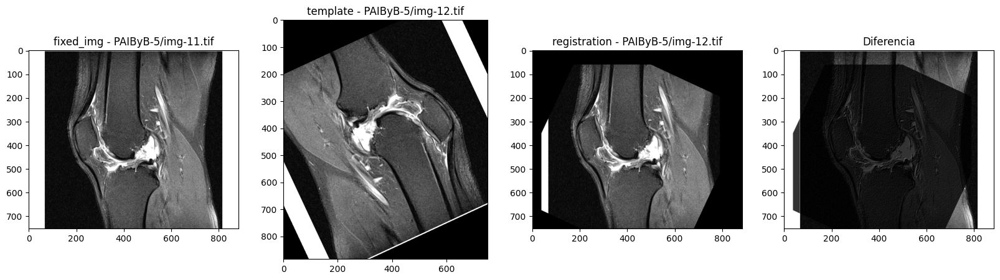

[np.int64(155), np.float64(0.9523078799247742)]


In [110]:
fixed_img_5g2 = imgs_paibyb5_group2[0]

reg_5g2_1, data_reg_5g2_1 = matchImg(fixed_img_5g2,imgs_paibyb5_group2[1],mode=1,cut_template=True)

plotMatchComparison(fixed_img_5g2,imgs_paibyb5_group2[1],reg_5g2_1,fixed_img_name=values_paibyb5_group2[0],template_name=values_paibyb5_group2[1])

print(data_reg_5g2_1)

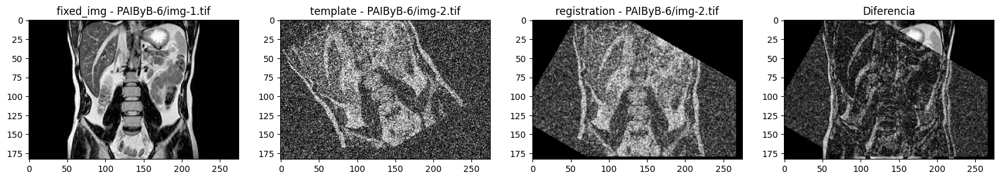

[np.int64(-30), np.float64(0.8062126040458679)]


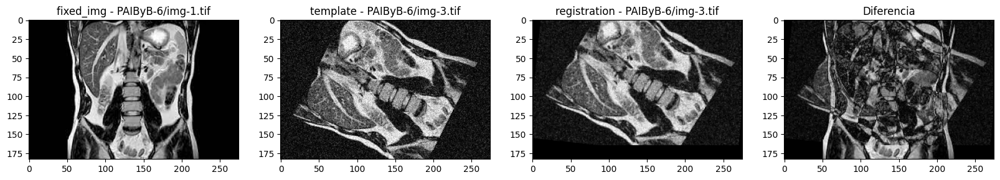

[np.int64(354), np.float64(0.7202154994010925)]


In [191]:
fixed_img_6g1 = imgs_paibyb6_group1[0]

reg_6g1_1, data_reg_6g1_1 = matchImg(fixed_img_6g1,imgs_paibyb6_group1[1],mode=1,counterclockwise=False)
reg_6g1_2, data_reg_6g1_2 = matchImg(fixed_img_6g1,imgs_paibyb6_group1[2],mode=1,a=0.1)

plotMatchComparison(fixed_img_6g1,imgs_paibyb6_group1[1],reg_6g1_1,fixed_img_name=values_paibyb6_group1[0],template_name=values_paibyb6_group1[1])
print(data_reg_6g1_1)
plotMatchComparison(fixed_img_6g1,imgs_paibyb6_group1[2],reg_6g1_2,fixed_img_name=values_paibyb6_group1[0],template_name=values_paibyb6_group1[2])
print(data_reg_6g1_2)

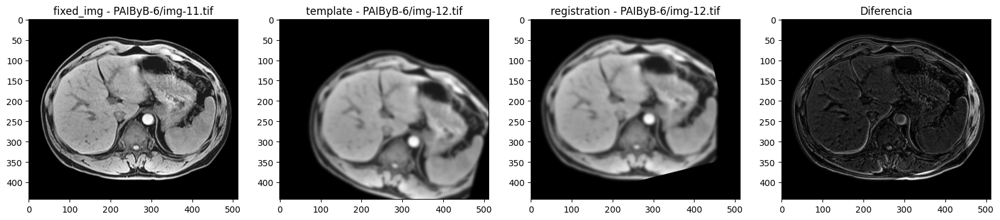

[np.int64(14), np.float64(0.9468894600868225)]


In [112]:
fixed_img_6g2 = imgs_paibyb6_group2[0]

reg_6g2_1, data_reg_6g2_1 = matchImg(fixed_img_6g2,imgs_paibyb6_group2[1],mode=1)

plotMatchComparison(fixed_img_6g2,imgs_paibyb6_group2[1],reg_6g2_1,fixed_img_name=values_paibyb6_group2[0],template_name=values_paibyb6_group2[1])
print(data_reg_6g2_1)

### Pre-procesamiento

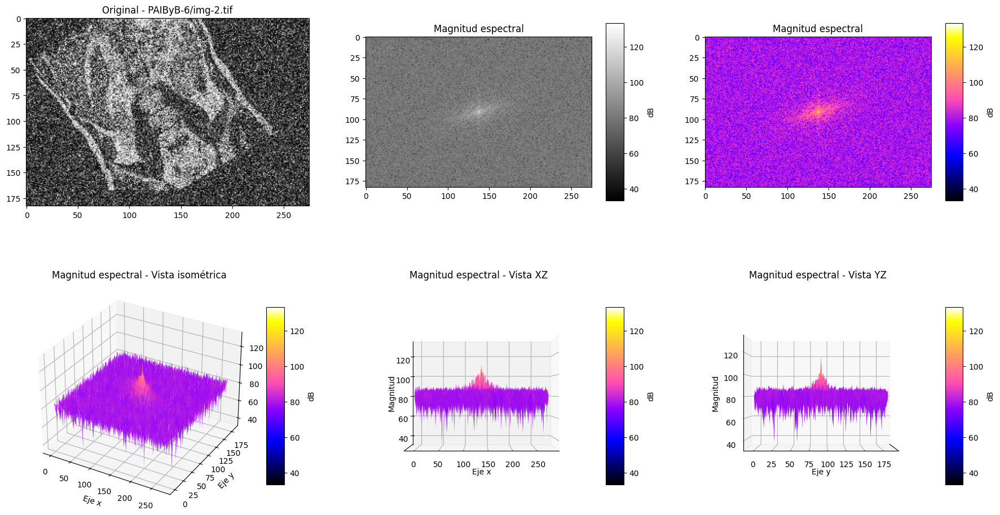

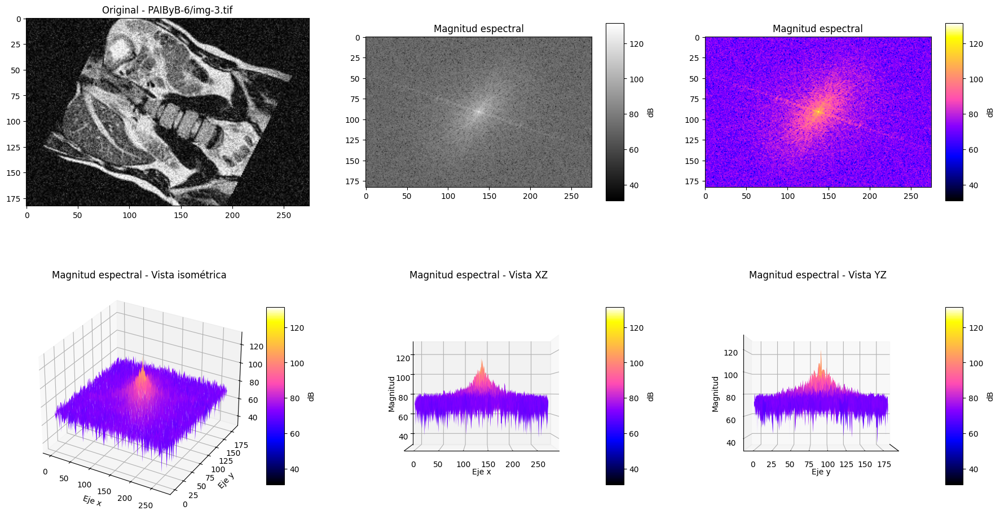

In [127]:
for i in range(1,len(imgs_paibyb6_group1)):
    fig = ffta.cr8FFTimgsPlots(imgs_paibyb6_group1[i],values_paibyb6_group1[i])


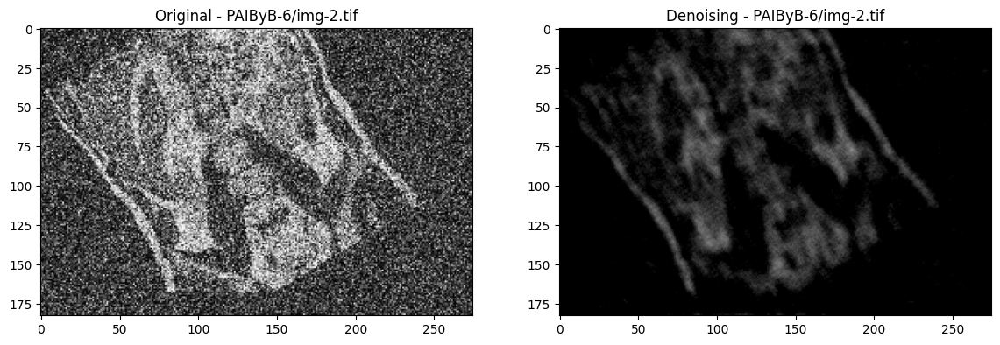

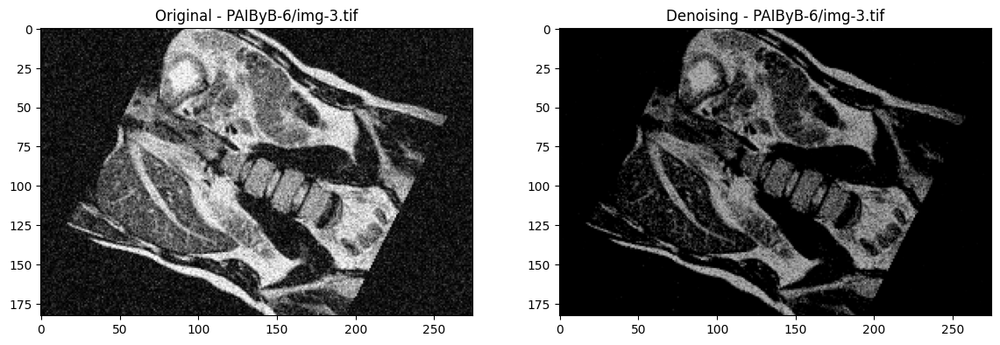

In [158]:
ths_img_2 = [89,125]
ths_img_3 = [70,125]

ths_list = [ths_img_2,ths_img_3]

filtered_imgs = []

for i in range(len(ths_list)):
    rec_img = ffta.cr8FFTDenoisingPlots(imgs_paibyb6_group1[1+i],ths_list[i],name=values_paibyb6_group1[1+i])
    filtered_imgs.append(rec_img)

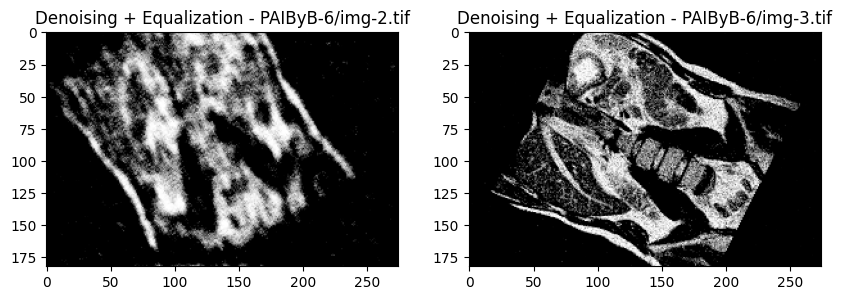

In [175]:
filtered_n_equ_imgs = np.array([cv2.equalizeHist(img) for img in filtered_imgs])

fig = plt.figure(figsize=(10,7))
for i, img, name in zip(range(1,3),filtered_n_equ_imgs,values_paibyb6_group1[1:]): 
    
    ax = fig.add_subplot(2,2,i)
    ax.imshow(img,cmap='gray')
    ax.set_title(f'Denoising + Equalization - {name}')

plt.show()

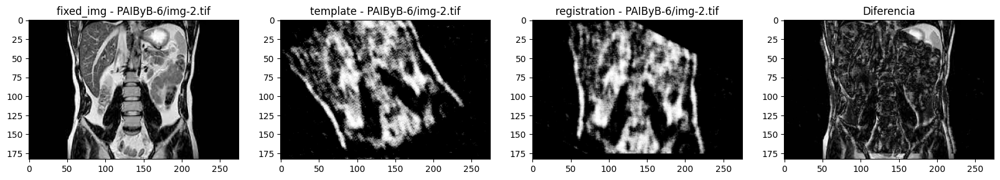

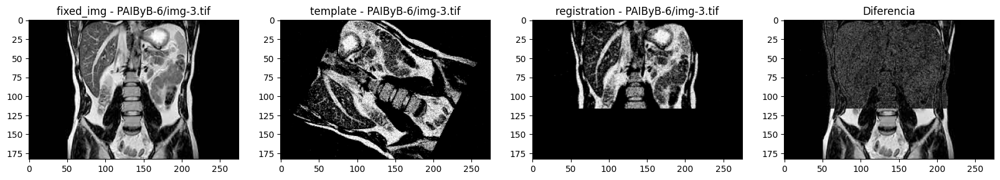

In [252]:
reg0, data0 = matchImg(fixed_img_6g1,filtered_n_equ_imgs[0],mode=2)
reg1, data1 = matchImg(fixed_img_6g1,filtered_n_equ_imgs[1],mode=2)

plotMatchComparison(fixed_img_6g1,filtered_n_equ_imgs[0],reg0,fixed_img_name=values_paibyb6_group1[1],template_name=values_paibyb6_group1[1])
plotMatchComparison(fixed_img_6g1,filtered_n_equ_imgs[1],reg1,fixed_img_name=values_paibyb6_group1[2],template_name=values_paibyb6_group1[2])